<a href="https://colab.research.google.com/github/manognapalla/Data-Science-Methods/blob/master/Model_Interpretability.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# INFO6105: Data Science Engineering Methods

#Assignment 3: Model Interpretability


The aim is to acheive the below:

1. Fit a linear model and interpret the regression coefficients

2. Fit a tree-based model and interpret the nodes

3.  Use auto ml to find the best model

4. Run SHAP analysis on the models from steps 1, 2, and 3,   interpret the SHAP values and compare them with the other model interpretability methods.

# Disease Outbreaks in Nigeria Dataset

https://www.kaggle.com/datasets/eiodelami/disease-outbreaks-in-nigeria-datasets

The objective is to construct a predictive model for anticipating meningitis disease outbreaks in Nigeria. Given the complexity of accurately forecasting the next occurrence of meningitis, given its dependence on diverse factors, the focus is on establishing a model where age and report year serve as dependent variables, while the others function as independent variables. The pivotal influencing elements of the disease, determined through feature selection, will be incorporated. Subsequently, a disease prediction model will be developed using linear regression.



#Installing Dependencies

In [1]:
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future

In [2]:
#h2o install

!pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o

Looking in links: http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.3/265.3 MB 4.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for h2o: filename=h2o-3.44.0.2-py2.py3-none-any.whl size=265363806 sha256=663d1cfb94fc01f0c551605c3d2c305c5de1df24f3b20628c2052e3435bcef41
  Stored in directory: /root/.cache/pip/wheels/e9/ea/ab/889709967692e30c57c46137edd2cae6b2768bb65ec7cb8aa5
Successfully built h2o


In [4]:
#Importing all required libraries

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.impute import KNNImputer
from sklearn import tree
from sklearn import linear_model
from sklearn import ensemble
import statsmodels.api as sd
import sklearn.metrics as sm
from sklearn.model_selection import train_test_split
import random

import warnings
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
warnings.filterwarnings("ignore")

# importing shap
!pip install shap
import shap

import h2o
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
sns.set(context="notebook", palette="Spectral", style = 'darkgrid' ,font_scale = 1.5, color_codes=True)
import warnings
warnings.filterwarnings('ignore')
import os
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.compat import lzip
import statsmodels.stats.api as sms
from sklearn.model_selection import train_test_split as tts
from statsmodels.stats.outliers_influence import variance_inflation_factor
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from yellowbrick.regressor import ResidualsPlot
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 532.9/532.9 kB 8.1 MB/s eta 0:00:00


# Loading the Dataset and Exploring

Now that we have installed the H2O package, we can proceed with loading the dataset into the H2O environment before performing the necessary data analysis and modeling.

In [65]:
df_train = pd.read_csv("https://raw.githubusercontent.com/manognapalla/Data-Science-Methods/master/meningitis_dataset.csv")
# Reading CSV file into Pandas DataFrame


In [6]:
df_train.head()

,id,surname,firstname,middlename,gender,gender_male,gender_female,state,settlement,rural_settlement,...,NmA,NmC,NmW,health_status,alive,dead,report_outcome,unconfirmed,confirmed,null_serotype
0,1,Solade,Grace,Solape,Female,0,1,Rivers,Rural,1,...,0,0,0,alive,1,0,confirmed,0,1,1
1,2,Eneche,Kure,Balogun,Male,1,0,Ebonyi,Rural,1,...,0,0,1,Alive,1,0,Confirmed,1,0,1
2,3,Sanusi,Adaugo,Katerine,Female,0,1,Ogun,Urban,0,...,0,0,1,Dead,0,1,Not Confirmed,1,0,1
3,4,Sowore,Mooslemat,Ifedayo,Female,0,1,Ondo,Rural,1,...,0,0,1,Alive,1,0,Not Confirmed,1,0,1
4,5,Abdusalam,Yusuf,Okafor,Male,1,0,Oyo,Urban,0,...,0,0,1,Alive,1,0,Confirmed,1,0,1


In [66]:
#removing unnecessary attributes/features

df_train=df_train.drop(['surname', 'firstname', 'gender','state','settlement','disease','age_str','health_status', 'id','middlename', 'serotype','report_outcome', 'report_date', 'report_year', 'date_of_birth'], axis=1)


In [11]:

y_total=df_train['cholera']
df_train=df_train.drop(['cholera'],axis=1)

# response and predictors


num_cols=list(df_train._get_numeric_data().columns)
cat_cols=list(set(df_train.columns)-set(num_cols))
df_train.head()

#Storing Numerical and Categorical columns seperately

,gender_male,gender_female,rural_settlement,urban_settlement,age,child_group,adult_group,diarrhoea,measles,viral_haemmorrhaphic_fever,...,rubella_mars,malaria,NmA,NmC,NmW,alive,dead,unconfirmed,confirmed,null_serotype
0,0,1,1,0,32,0,1,0,0,0,...,0,0,0,0,0,1,0,0,1,1
1,1,0,1,0,32,0,1,0,0,0,...,0,0,0,0,1,1,0,1,0,1
2,0,1,0,1,24,0,1,0,0,0,...,0,0,0,0,1,0,1,1,0,1
3,0,1,1,0,63,0,1,0,1,0,...,0,0,0,0,1,1,0,1,0,1
4,1,0,0,1,9,1,0,0,0,0,...,1,0,0,0,1,1,0,1,0,1


In [12]:
#categorical variable encoding using a mapping dictionary as part of preprocessing data
mapping_dict={}
for col in cat_cols:
    mapping_dict[col]={k: i for i, k in enumerate(df_train[col].unique())}
    df_train[col] = df_train[col].map(mapping_dict[col])

In [13]:
df_train.head()

,gender_male,gender_female,rural_settlement,urban_settlement,age,child_group,adult_group,diarrhoea,measles,viral_haemmorrhaphic_fever,...,rubella_mars,malaria,NmA,NmC,NmW,alive,dead,unconfirmed,confirmed,null_serotype
0,0,1,1,0,32,0,1,0,0,0,...,0,0,0,0,0,1,0,0,1,1
1,1,0,1,0,32,0,1,0,0,0,...,0,0,0,0,1,1,0,1,0,1
2,0,1,0,1,24,0,1,0,0,0,...,0,0,0,0,1,0,1,1,0,1
3,0,1,1,0,63,0,1,0,1,0,...,0,0,0,0,1,1,0,1,0,1
4,1,0,0,1,9,1,0,0,0,0,...,1,0,0,0,1,1,0,1,0,1


In [17]:
# Normalizing as part of preprocessing

# normalizing numerical columns
num_cols=['age']

from sklearn import preprocessing
feature_to_scale = num_cols

# normalizing using minmax
min_max_scaler = preprocessing.MinMaxScaler()

# Transform the data to fit minmax processor
df_train[feature_to_scale] = min_max_scaler.fit_transform(df_train[feature_to_scale])

df_train.head()


,gender_male,gender_female,rural_settlement,urban_settlement,age,child_group,adult_group,diarrhoea,measles,viral_haemmorrhaphic_fever,...,rubella_mars,malaria,NmA,NmC,NmW,alive,dead,unconfirmed,confirmed,null_serotype
0,0,1,1,0,0.410256,0,1,0,0,0,...,0,0,0,0,0,1,0,0,1,1
1,1,0,1,0,0.410256,0,1,0,0,0,...,0,0,0,0,1,1,0,1,0,1
2,0,1,0,1,0.307692,0,1,0,0,0,...,0,0,0,0,1,0,1,1,0,1
3,0,1,1,0,0.807692,0,1,0,1,0,...,0,0,0,0,1,1,0,1,0,1
4,1,0,0,1,0.115385,1,0,0,0,0,...,1,0,0,0,1,1,0,1,0,1


In [19]:
#identifying types of columns in the dataset
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284484 entries, 0 to 284483
Data columns (total 24 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   gender_male                 284484 non-null  int64  
 1   gender_female               284484 non-null  int64  
 2   rural_settlement            284484 non-null  int64  
 3   urban_settlement            284484 non-null  int64  
 4   age                         284484 non-null  float64
 5   child_group                 284484 non-null  int64  
 6   adult_group                 284484 non-null  int64  
 7   diarrhoea                   284484 non-null  int64  
 8   measles                     284484 non-null  int64  
 9   viral_haemmorrhaphic_fever  284484 non-null  int64  
 10  meningitis                  284484 non-null  int64  
 11  ebola                       284484 non-null  int64  
 12  marburg_virus               284484 non-null  int64  
 13  yellow_fever  

In [21]:
#check for null values
df_train.isnull().sum()

gender_male                   0
gender_female                 0
rural_settlement              0
urban_settlement              0
age                           0
child_group                   0
adult_group                   0
diarrhoea                     0
measles                       0
viral_haemmorrhaphic_fever    0
meningitis                    0
ebola                         0
marburg_virus                 0
yellow_fever                  0
rubella_mars                  0
malaria                       0
NmA                           0
NmC                           0
NmW                           0
alive                         0
dead                          0
unconfirmed                   0
confirmed                     0
null_serotype                 0
dtype: int64

No null values in the dataset.

In [23]:
#obtain the dimensions (number of rows and columns) of the DataFrame/dataset
df_train.shape

(284484, 24)

In [24]:
# Statistical description of our dataset
df_train.describe()

,gender_male,gender_female,rural_settlement,urban_settlement,age,child_group,adult_group,diarrhoea,measles,viral_haemmorrhaphic_fever,...,rubella_mars,malaria,NmA,NmC,NmW,alive,dead,unconfirmed,confirmed,null_serotype
count,284484.000000,284484.000000,284484.000000,284484.000000,284484.000000,284484.000000,284484.000000,284484.000000,284484.000000,284484.000000,...,284484.000000,284484.000000,284484.000000,284484.000000,284484.000000,284484.000000,284484.000000,284484.000000,284484.000000,284484.000000
mean,0.482319,0.517681,0.501128,0.498872,0.445287,0.291707,0.708293,0.100357,0.100079,0.099833,...,0.100318,0.100304,0.024740,0.025063,0.950194,0.499835,0.500165,0.749691,0.250309,0.900304
std,0.499688,0.499688,0.500000,0.500000,0.285140,0.454549,0.454549,0.300476,0.300106,0.299778,...,0.300425,0.300406,0.155331,0.156317,0.217544,0.500001,0.500001,0.433192,0.433192,0.299595
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.179487,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,0.000000,1.000000,1.000000,0.000000,0.435897,0.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000
75%,1.000000,1.000000,1.000000,1.000000,0.692308,1.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Running df_train.describe() provides a quick overview of the central tendency and spread of the numerical data in your DataFrame, helping you to identify potential outliers or understand the distribution of the data.

This table shows summary statistics for a dataset with 284484 observations and 24 variables.

Mean and median ages are close, the age distribution is likely symmetric.

Creating a correlation heat map:

Text(0.5, 1.0, 'Correlation Heat Map')

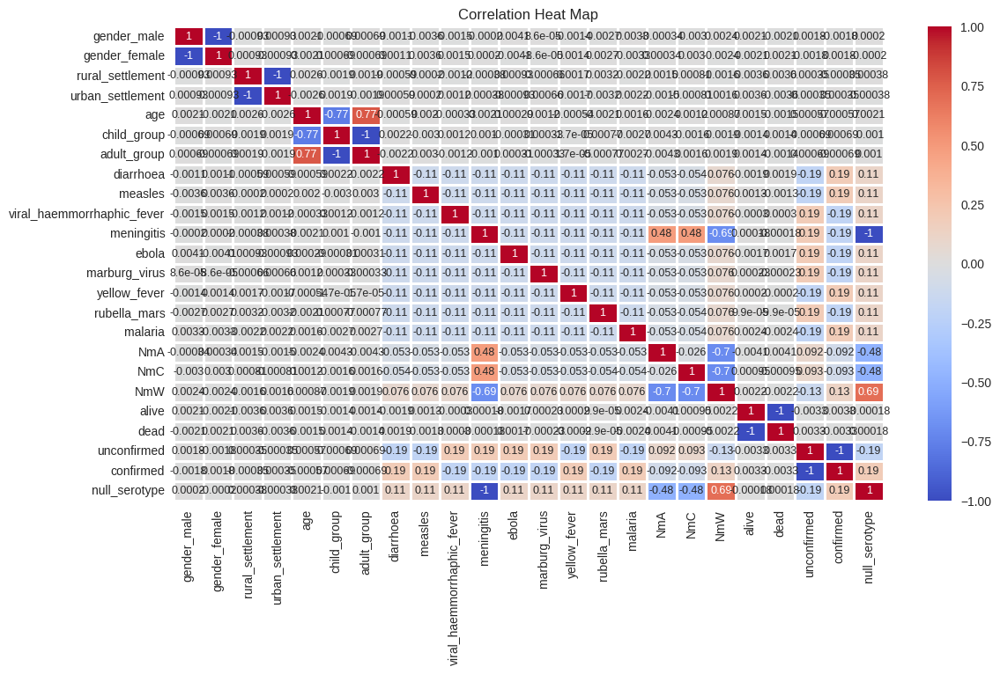

In [25]:
from IPython.core.pylabtools import figsize
f,ax=plt.subplots(figsize=(13,7))

sns.heatmap(df_train.corr(),center=0, linewidths=0.9,cmap='coolwarm',annot=True, annot_kws={"size": 9})
plt.title('Correlation Heat Map')

We can interpret the above heatmap and see the following:

1. There is a strong positive correlation between age and confirmed cases, unconfirmed cases, and death. This means that as people get older, they are more likely to contract diseases and die from it.

2. There is a strong positive correlation between NmA and NmC, and between NmC and NmW. This suggests that there is some overlap between these three variables.

3. There is a strong negative correlation between "dead" and confirmed cases. This is also to be expected, as people who are dead are less likely to have been diagnosed with diseases :)

4. There is a strong positive correlation between "urban settlement" and confirmed cases, unconfirmed cases, and death. This means that people who live in urban areas are more likely to contract diseases and die from it.



# Fitting a linear model and interpreting the coefficients:


Performing logistic regression:

In [26]:
import statsmodels.api as sd
train_X, val_X, train_y, val_y = train_test_split(df_train, y_total, random_state=1)
log_reg = sd.Logit(train_y,train_X).fit()
print(log_reg.summary())

         Current function value: 0.000000
         Iterations: 35
                           Logit Regression Results                           
Dep. Variable:                cholera   No. Observations:               213363
Model:                          Logit   Df Residuals:                   213344
Method:                           MLE   Df Model:                           18
Date:                Sun, 03 Dec 2023   Pseudo R-squ.:                   1.000
Time:                        00:53:05   Log-Likelihood:            -0.00030679
converged:                      False   LL-Null:                       -69579.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------
gender_male                    2.6087   1.12e+12   2.33e-12      1.000   -2.19e+12    2.19e+12
gender_female    

Interpreting the above:

1. From the table we can see that the p value of most of the features are 1.00.
2. p-values of 1.00 for most features indicate a 100% chance of observing the same or a larger difference between groups even if there's no actual effect.
3. P = 1.00 means is that if the null hypothesis is true and if we perform the study in an identical manner a large number of times, then on 100% of occasions we will obtain a difference between groups of 0% or greater.

Features such as Age has p value more tha 5% and hence they are important feature.
Though we can see that the p-values are different for all our features, we can't actually rank them at this point.

Running Shap analysis is a good next step. Shap explains individual predictions and feature importance, providing a more nuanced view than p-values. It can help identify features contributing most to specific predictions and highlight non-linear relationships.

In [28]:
#Linear Regression model for dataset
def linear_reg(X_train,y_train,val_X,val_y):
    linear_reg = LinearRegression()
    linear_reg_model = linear_reg.fit(train_X,train_y)
    print('Train set')
    pred=linear_reg_model.predict(train_X)
    print('Linear Regression Mean Squared error :{}'.format(mean_squared_error(train_y,pred)))
    print('Linear Regression r2_score :{}'.format(r2_score(train_y,pred)))
    print('Test set')
    pred=linear_reg_model.predict(val_X)
    model_lr=linear_reg_model.predict(val_X)
    print('Linear Regression Mean Squared error :{}'.format(mean_squared_error(val_y,pred)))
    print('Linear Regression r2_score :{}'.format(r2_score(val_y,pred)))

In [29]:
from sklearn import linear_model

model = linear_model.LinearRegression()
model.fit(train_X, train_y)

LinearRegression()

In [30]:
cols1= ['gender_male', 'gender_female', 'rural_settlement' , 'urban_settlement' , 'age','child_group', 'adult_group', 'diarrhoea', 'measles', 'viral_haemmorrhaphic_fever', 'meningitis', 'ebola', 'marburg_virus', 'yellow_fever', 'rubella_mars', 'malaria', 'NmA', 'NmC', 'NmW', 'alive', 'dead', 'unconfirmed', 'confirmed', 'null_serotype'  ]

In [31]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
#Computing R2 for testing and training data
linear_reg(train_X[cols1],train_y,val_X[cols1],val_y)

Train set
Linear Regression Mean Squared error :4.845225855103805e-31
Linear Regression r2_score :1.0
Test set
Linear Regression Mean Squared error :4.826252354012502e-31
Linear Regression r2_score :1.0


Linear Regression Mean Squared Error (MSE):

Similar to the training set, the MSE on the test set is extremely close to zero (4.826e-31). This suggests that the model's predictions on the test set are also very accurate.
Linear Regression R-squared (R2) Score:

The R-squared score on the test set is also 1.0, indicating that the model explains all the variability in the test set. This is a strong indication of a well-fitted model.

To consider the possibility of overfitting SHAP will be conducted.

# SHAP values for Logistic regression::

SHAP (SHapley Additive exPlanations) values are a way to explain the output of machine learning models, providing insights into the contribution of each feature to the final prediction. For logistic regression, SHAP values can help interpret the impact of individual features on the log-odds of the predicted outcome.

In [32]:
# Giving input as 1% of whole dataset as SHAP cant handle large dataset
X = train_X.sample(frac=0.01,random_state=200)
clf_model = LogisticRegression(random_state=0).fit(train_X, train_y)
#LinearExplainer is used as linear regression model is used
explainer = shap.LinearExplainer(clf_model, train_X, feature_perturbation="interventional")
shap_values = explainer.shap_values(val_X) #Saving SHAP values

### SHAP Analysis for a single point

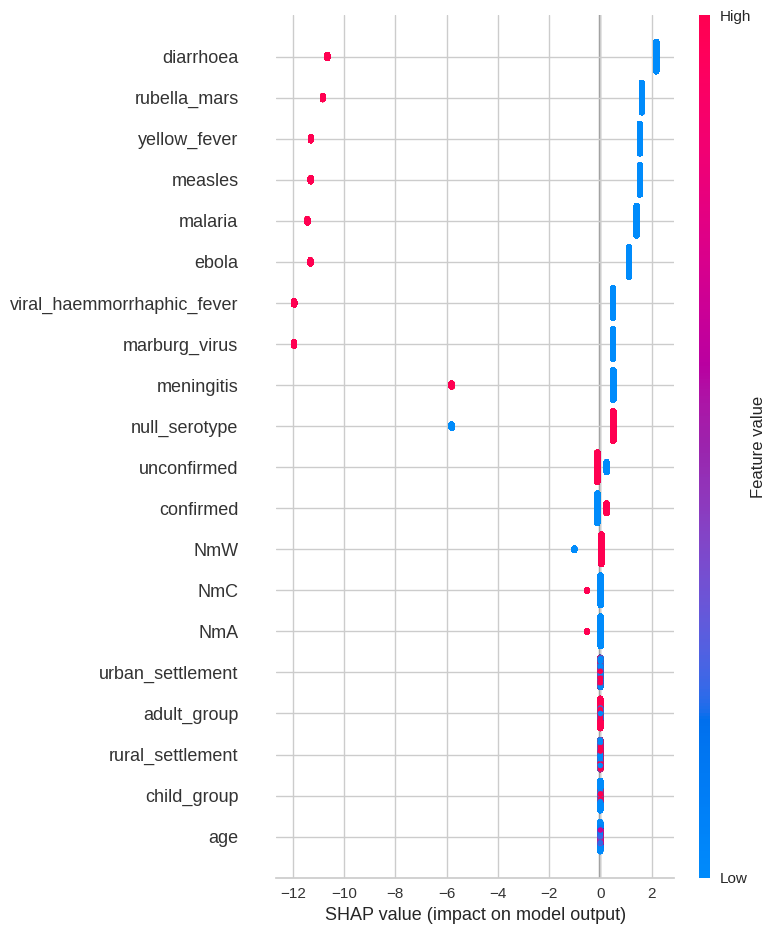

In [33]:
shap.summary_plot(shap_values, val_X, feature_names=list(train_X.columns))

It can be interpreted as below:

1. People who have yellow_fever, ebola, measles and malaria seem to more readily to contract Cholera
2. People who NmA, NmC, NmA have significantly less chances of contracting Cholera.

In [34]:
#plotting force plots for visualizing SHAP values

shap.initjs()
shap.plots.force(explainer.expected_value,shap_values[17],feature_names=list(train_X.columns))
#shap.force_plot(explainer.expected_value, shap_values, val_X.iloc[1], feature_names=list(train_X.columns))

Above can be interpreted as:

1. Diarrhoea is the most important feature for predicting the probability that a person will have cholera or not.
2. Malaria, Rubella_Mars, Measles, Ebola, Yellow_Fever and Viral_Haemmorrhaphic_Fever seem to push the value away from base_value.
3. Diarrhoea are the features which push the value towards the base value.

In [35]:
#visualizing for one row:
shap.initjs()


shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:])

In [36]:
#Initializing explainer from shap, lm is our trained model
explainer_shap=shap.LinearExplainer(model=model, masker=train_X)

#Computing shap values for train dataset
shap_values = explainer_shap.shap_values(train_X)

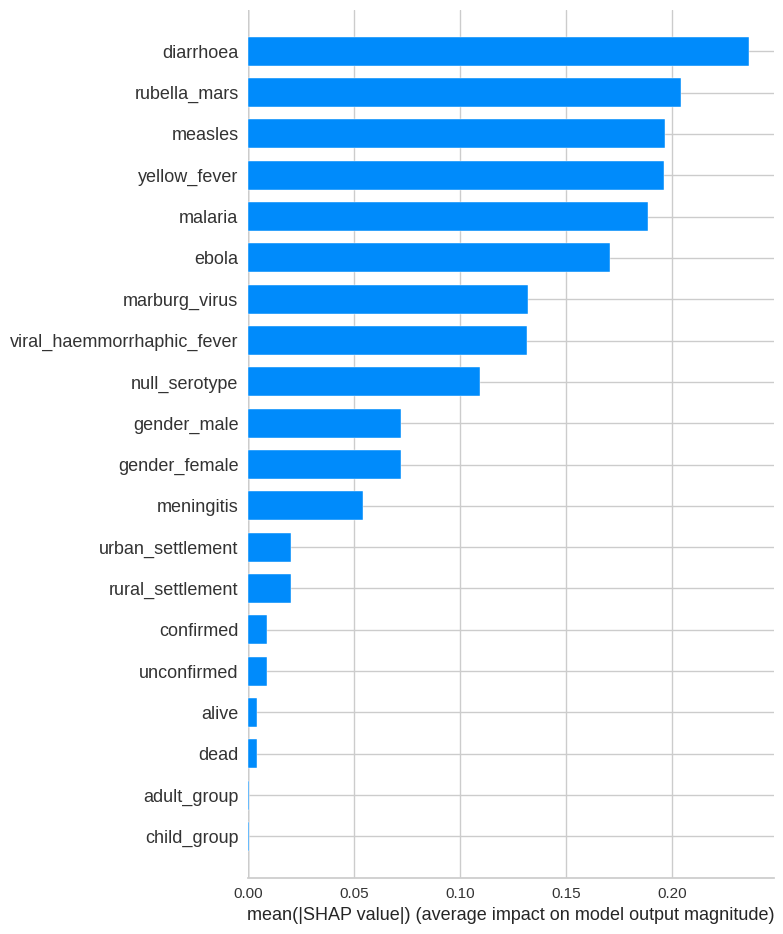

In [37]:
shap.summary_plot(shap_values, X, plot_type="bar")

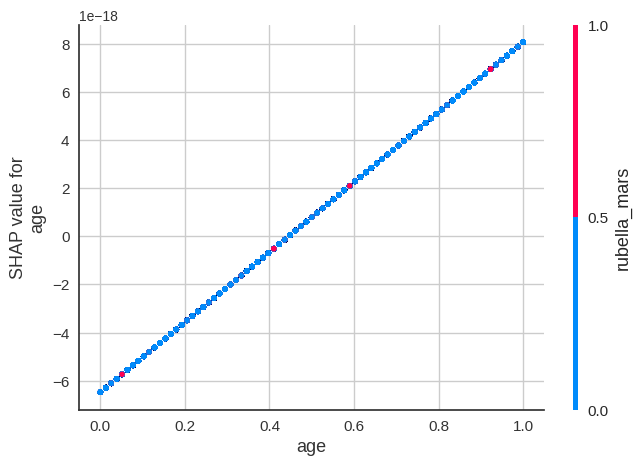

In [38]:
shap.dependence_plot("age", shap_values, train_X)

In [39]:
from sklearn.linear_model import LinearRegression
import shap

# train Linear model
#Seperating the dependent and independent variable from the main dataset
X=df_train.drop(['malaria'],axis=1)
y=df_train['malaria']
regressor = LinearRegression()
linear_reg = regressor.fit(X, y)

# compute SHAP values
explainer = shap.Explainer(linear_reg, X)
shap_values = explainer(X)

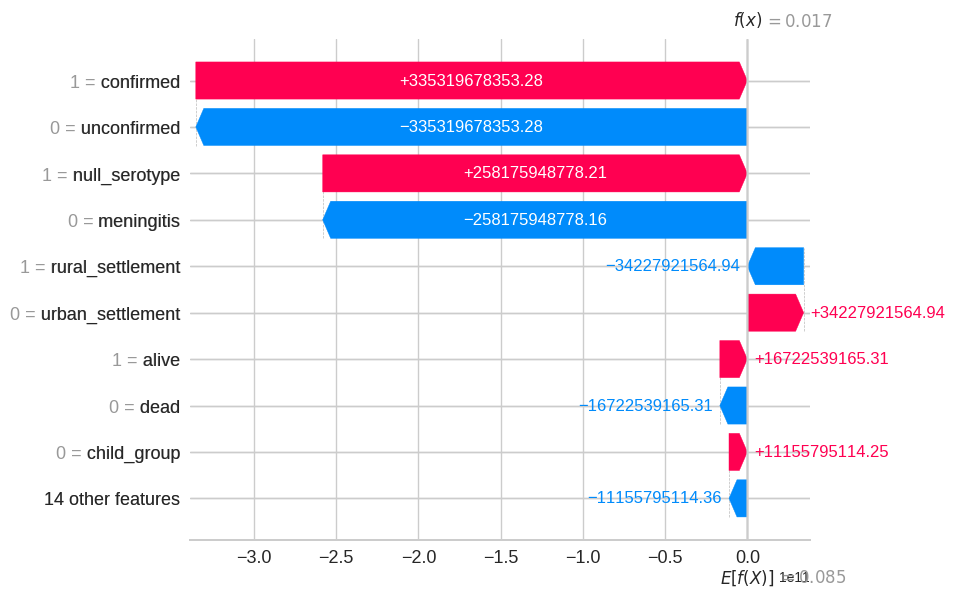

In [40]:
shap.plots.waterfall(shap_values[0])

From the plots it can be interpreted that null_serotype, meningitis, confirmed and unconfirmed are the important features for this regressor model.
These are the major features in determining the cholera disease.

# 2. Fitting a tree based model and Interpreting the coefficients.

In [41]:
my_model = DecisionTreeClassifier(random_state=42).fit(train_X, train_y)

#Feature importance of Decision Tree model

<BarContainer object of 24 artists>

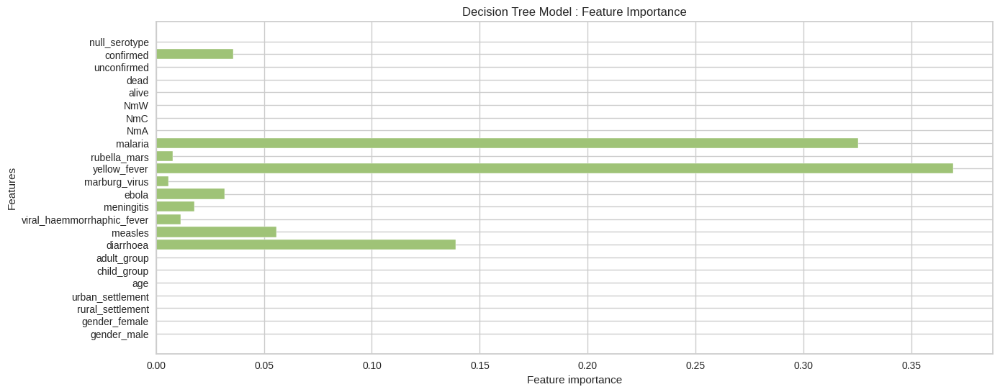

In [42]:
plt.figure(figsize=(15,6))
importances = my_model.feature_importances_
features = list(train_X.columns)
plt.title("Decision Tree Model : Feature Importance")
plt.xlabel('Feature importance')
plt.ylabel('Features')
plt.barh(features,importances,color='g')


From the above plot we see that Yellow Fever is the most important feature for predicting the decision of buying a travel insurance.
Features such as Malaria and Diarrhoea are also some other important features

# Plotting the Decision Tree

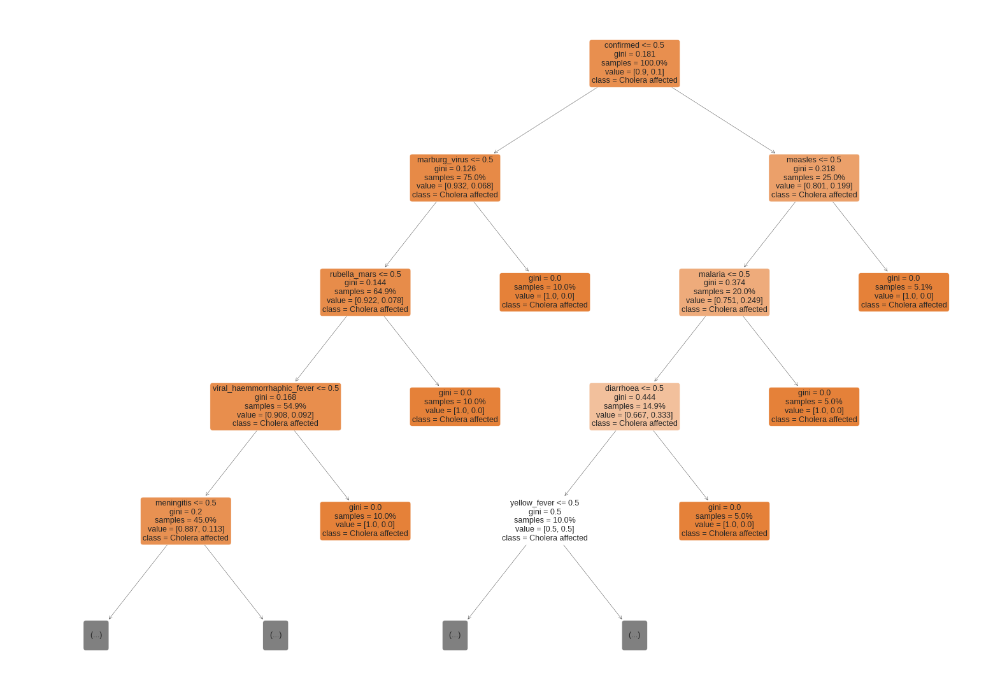

In [43]:
fig = plt.figure(figsize=(20, 14))
vis = tree.plot_tree(my_model, feature_names = features, class_names = ['Cholera affected', 'Cholera Not affected'], max_depth=4, fontsize=9, proportion=True, filled=True, rounded=True)

1. Measles is the first node which is causing splitting of samples
2. Rest of the nodes in subsequest levels are important as their appearance

# SHAP Analysis for a single point

In [44]:
row_to_show = 17
data_for_prediction = val_X.iloc[row_to_show]  # use 1 row of data here. Could use multiple rows if desired
data_for_prediction_array = data_for_prediction.values.reshape(1, -1)

explainer = shap.TreeExplainer(my_model)

# Calculate Shap values
shap_values = explainer.shap_values(data_for_prediction)

In [45]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1], data_for_prediction,feature_names=list(val_X.columns))

We can interpret that:
1. Diarrhoea is the most important feature for predicting the probability that a person will have cholera or not

2. Malaria, Ebola, Measles, Confirmed and Yellow_Fever seem to push the value away from base_value

3. Diarrhoea variable is pushing the value towards the base value

# 3. Using an AutoML Models and Interpretability

In [46]:
#defining the environment variables of h2o
import psutil
import h2o
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime
import logging
import optparse
import time
import json
min_mem_size=6
run_time=60
pct_memory=0.5
virtual_memory=psutil.virtual_memory()
min_mem_size=int(round(int(pct_memory*virtual_memory.available)/1073741824,0))
print(min_mem_size)
port_no=random.randint(5555,55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
except:
  logging.critical('h2o.init')
  h2o.download_all_logs(dirname=logs_path, filename=logfile)
  h2o.cluster().shutdown()
  sys.exit(2)

5
Checking whether there is an H2O instance running at http://localhost:46670..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.21" 2023-10-17; OpenJDK Runtime Environment (build 11.0.21+9-post-Ubuntu-0ubuntu122.04); OpenJDK 64-Bit Server VM (build 11.0.21+9-post-Ubuntu-0ubuntu122.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpl_6rhr6t
  JVM stdout: /tmp/tmpl_6rhr6t/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpl_6rhr6t/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:46670
Connecting to H2O server at http://127.0.0.1:46670 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.44.0.2
H2O_cluster_version_age:,24 days
H2O_cluster_name:,H2O_from_python_unknownUser_fyq3r1
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,5 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [47]:
#function for coverting binary to yes/no

def convert_binary_to_yesno(x):
    if x == 1:
        return "Yes"
    else:
        return "No"

In [49]:
df_h = h2o.import_file("https://raw.githubusercontent.com/manognapalla/Data-Science-Methods/master/meningitis_dataset.csv")
df_h = df_h.drop(['cholera'],axis=1)

df_h.head()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


id,surname,firstname,middlename,gender,gender_male,gender_female,state,settlement,rural_settlement,urban_settlement,report_date,report_year,age,age_str,date_of_birth,child_group,adult_group,disease,diarrhoea,measles,viral_haemmorrhaphic_fever,meningitis,ebola,marburg_virus,yellow_fever,rubella_mars,malaria,serotype,NmA,NmC,NmW,health_status,alive,dead,report_outcome,unconfirmed,confirmed,null_serotype
1,Solade,Grace,Solape,Female,0,1,Rivers,Rural,1,0,2018-05-15 00:00:00,2018,32,32 years,1986-01-17 00:00:00,0,1,Cholera,0,0,0,0,0,0,0,0,0,null serotype,0,0,0,alive,1,0,confirmed,0,1,1
2,Eneche,Kure,Balogun,Male,1,0,Ebonyi,Rural,1,0,2017-02-28 00:00:00,2017,32,32 years,1985-09-01 00:00:00,0,1,Marburg Virus,0,0,0,0,0,1,0,0,0,Null,0,0,1,Alive,1,0,Confirmed,1,0,1
3,Sanusi,Adaugo,Katerine,Female,0,1,Ogun,Urban,0,1,2012-03-02 00:00:00,2012,24,24 years,1988-05-01 00:00:00,0,1,Marburg Virus,0,0,0,0,0,1,0,0,0,Null,0,0,1,Dead,0,1,Not Confirmed,1,0,1
4,Sowore,Mooslemat,Ifedayo,Female,0,1,Ondo,Rural,1,0,2010-05-21 00:00:00,2010,63,63 years,1947-05-24 00:00:00,0,1,Measles,0,1,0,0,0,0,0,0,0,Null,0,0,1,Alive,1,0,Not Confirmed,1,0,1
5,Abdusalam,Yusuf,Okafor,Male,1,0,Oyo,Urban,0,1,2017-08-28 00:00:00,2017,9,9 years,2008-01-07 00:00:00,1,0,Rubella Mars,0,0,0,0,0,0,0,1,0,Null,0,0,1,Alive,1,0,Confirmed,1,0,1
6,Yakubu,Janet,Chioma,Female,0,1,Kaduna,Rural,1,0,2012-06-27 00:00:00,2012,44,44 years,1968-06-06 00:00:00,0,1,Ebola,0,0,0,0,1,0,0,0,0,Null,0,0,1,Alive,1,0,Confirmed,1,0,1
7,Razak,Adaugo,Adaobi,Female,0,1,Taraba,Rural,1,0,2010-04-01 00:00:00,2010,61,61 years,1949-07-19 00:00:00,0,1,Yellow Fever,0,0,0,0,0,0,1,0,0,Null,0,0,1,Alive,1,0,Confirmed,0,1,1
8,Annakyi,Danmbazzu,Osagie,Male,1,0,Katsina,Rural,1,0,2015-10-04 00:00:00,2015,2,2 months,2014-12-18 00:00:00,1,0,Diarrhoea,1,0,0,0,0,0,0,0,0,Null,0,0,1,Alive,1,0,Not Confirmed,1,0,1
9,Adejoro,Iyin,Osatimehin,Male,1,0,Katsina,Rural,1,0,2011-11-14 00:00:00,2011,54,54 years,1957-08-05 00:00:00,0,1,Rubella Mars,0,0,0,0,0,0,0,1,0,Null,0,0,1,Alive,1,0,Confirmed,1,0,1
10,Okorie,Adaugo,Chika,Female,0,1,Osun,Urban,0,1,2014-06-17 00:00:00,2014,15,15 years,1999-10-19 00:00:00,1,0,Marburg Virus,0,0,0,0,0,1,0,0,0,Null,0,0,1,Alive,1,0,Confirmed,1,0,1


In [50]:
pct_rows=0.80
df_train, df_test = df_h.split_frame([pct_rows])
print('Train dataframe size')
print(df_train.shape)
print('Test dataframe size')
print(df_test.shape)
#defining the predictor and response variable for our model
X=df_h.columns
y ='gender'
# df_h['Cholera'] = df_h['Cholera'].apply(convert_binary_to_yesno)
X.remove(y)
print('The predictor variables are as follows')
print(X)
print('The response variable is')
print(y)

Train dataframe size
(227677, 39)
Test dataframe size
(56807, 39)
The predictor variables are as follows
['id', 'surname', 'firstname', 'middlename', 'gender_male', 'gender_female', 'state', 'settlement', 'rural_settlement', 'urban_settlement', 'report_date', 'report_year', 'age', 'age_str', 'date_of_birth', 'child_group', 'adult_group', 'disease', 'diarrhoea', 'measles', 'viral_haemmorrhaphic_fever', 'meningitis', 'ebola', 'marburg_virus', 'yellow_fever', 'rubella_mars', 'malaria', 'serotype', 'NmA', 'NmC', 'NmW', 'health_status', 'alive', 'dead', 'report_outcome', 'unconfirmed', 'confirmed', 'null_serotype']
The response variable is
gender


In [51]:
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)
# Passing the training and testing dataset through H20 AutomML
aml.train(x=X,y=y,training_frame=df_train)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: GBM_1_AutoML_1_20231203_14944


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    70                 70                          6212                   1            2            1.02857       2             4             2.04286

ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 1.9323485088354e-07
RMSE: 0.00043958486198177933
LogLoss: 0.00043942389081296906
Mean Per-Class Error: 0.0
AUC: 1.0
AUCPR: 1.0
Gini: 1.0

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.999545071514751
        Female    Male    Error    Rate
------  --------  ------  -------  --------------
Female  82557     0       0        (0.0/82557.0)
Male    0         76799   0        (0.0/76799.0)
Total   82557     76799   0        (0.0/159356.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value    idx
---------------------------  -----------  -------  -----
max f1                       0.999545     1        0
max f2                       0.999545     1        0
max f0point5                 0.999545     1        0
max accuracy                 0.999545     1        0
max precision                0.999545     1        0
max recall                   0.999545     1        0
max specificity              0.999545     1        0
max absolute_mcc             0.999545     1        0
max min_per_class_accuracy   0.999545     1        0
max mean_per_class_accuracy  0.999545     1        0
max tns                      0.999545     82557    0
max fns                      0.999545     0        0
max fps                      0.000424814  82557    1
max tps                      0.999545     76799    0
max tnr                      0.999545     1        0
max fnr                      0.999545     0        0
max fpr                      0.000424814  1        1
max tpr                      0.999545     1        0

Gains/Lift Table: Avg response rate: 48.19 %, avg score: 48.19 %
group    cumulative_data_fraction    lower_threshold    lift     cumulative_lift    response_rate    score        cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain     cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  -------  -----------------  ---------------  -----------  --------------------------  ------------------  --------------  -------------------------  -------  -----------------  --------------------
1        0.481934                    0.999545           2.07497  2.07497            1                0.999545     1                           0.999545            1               1                          107.497  107.497            1
2        1                           0.000424814        0        1                  0                0.000424814  0.481934                    0.481934            0               1                          -100     0                  0

ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 1.932395656414924e-07
RMSE: 0.0004395902246882799
LogLoss: 0.0004394292667874667
Mean Per-Class Error: 0.0
AUC: 1.0
AUCPR: 1.0
Gini: 1.0

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.9995450716592925
        Female    Male    Error    Rate
------  --------  ------  -------  -------------
Female  11734     0       0        (0.0/11734.0)
Male    0         10923   0        (0.0/10923.0)
Total   11734     10923   0        (0.0/22657.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value    idx
---------------------------  -----------  -------  -----
max f1                

In [52]:
print(aml.leaderboard)

model_id                                                  auc      logloss    aucpr    mean_per_class_error         rmse          mse
GBM_1_AutoML_1_20231203_14944                               1  0.000439429        1                       0  0.00043959   1.9324e-07
GLM_1_AutoML_1_20231203_14944                               1  0.425159           1                       0  0.346441     0.120021
StackedEnsemble_BestOfFamily_1_AutoML_1_20231203_14944      1  8.2165e-05         1                       0  8.22146e-05  6.75923e-09
XGBoost_1_AutoML_1_20231203_14944                           1  0.000199768        1                       0  0.000199886  3.99543e-08
[4 rows x 7 columns]



In [53]:
model_index=0
glm_index=0
glm_model=''
aml_leaderboard_df=aml.leaderboard.as_data_frame()
models_dict={}
for m in aml_leaderboard_df['model_id']:
  models_dict[m]=model_index
  if 'StackedEnsemble' not in m:
    break
  model_index=model_index+1

for m in aml_leaderboard_df['model_id']:
  if 'GLM' in m:
    models_dict[m]=glm_index
    break
  glm_index=glm_index+1
models_dict

{'GBM_1_AutoML_1_20231203_14944': 0, 'GLM_1_AutoML_1_20231203_14944': 1}

In [54]:
print(model_index)
best_model = h2o.get_model(aml.leaderboard[model_index,'model_id'])

0


In [55]:
#Printing the best model
print("The best model is - " , best_model.algo)

The best model is -  gbm


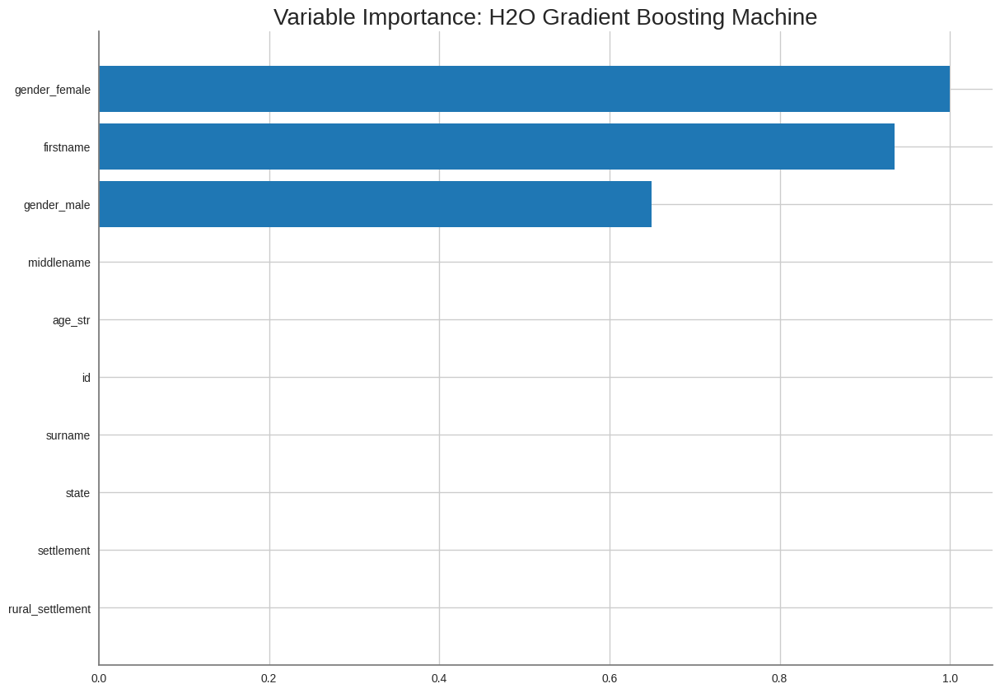

<Figure size 800x550 with 0 Axes>

In [56]:
#plot variables in order of their importance for price prediction
if best_model.algo in ['gbm','drf','xrt','xgboost']:
    best_model.varimp_plot()

1
glm


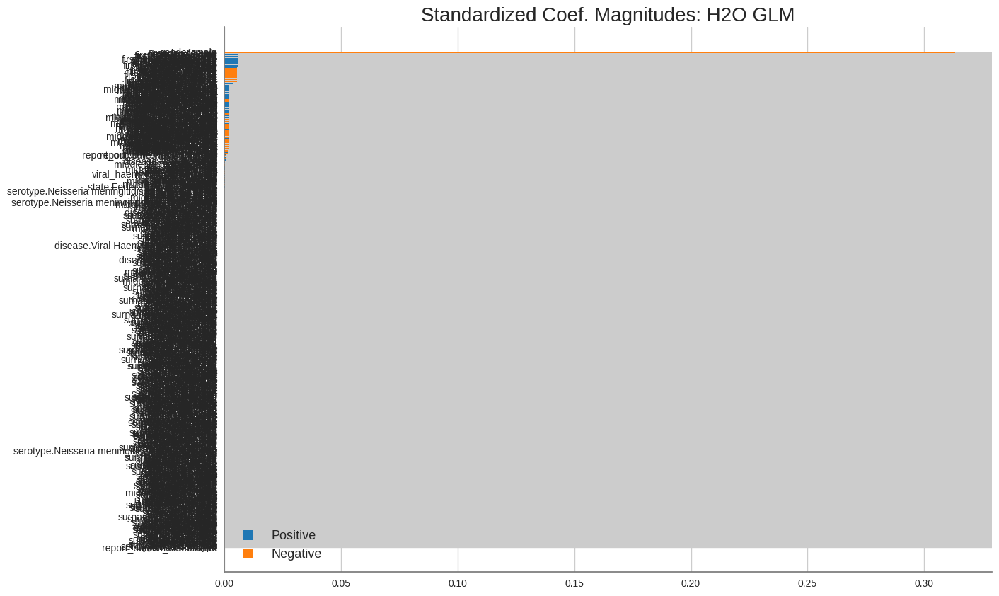

In [57]:
if glm_index is not 0:
  print(glm_index)
  glm_model=h2o.get_model(aml.leaderboard[glm_index,'model_id'])
  print(glm_model.algo)
  glm_model.std_coef_plot()

# SHAP Analysis on AutoML Model

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse,training_time_ms,predict_time_per_row_ms,algo
GBM_1_AutoML_1_20231203_14944,1,0.000439474,1,0,0.000439635,1.93279e-07,16529,0.016634,GBM
GLM_1_AutoML_1_20231203_14944,1,0.425215,1,0,0.346477,0.120046,18608,0.00531,GLM
StackedEnsemble_BestOfFamily_1_AutoML_1_20231203_14944,1,8.21737e-05,1,0,8.22233e-05,6.76067e-09,8342,0.026288,StackedEnsemble
XGBoost_1_AutoML_1_20231203_14944,1,0.000199792,1,0,0.000199909,3.99637e-08,15910,0.004572,XGBoost


# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## GBM_1_AutoML_1_20231203_14944

,Female,Male,Error,Rate
Female,29335.0,0.0,0.0,(0.0/29335.0)
Male,0.0,27472.0,0.0,(0.0/27472.0)
Total,29335.0,27472.0,0.0,(0.0/56807.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

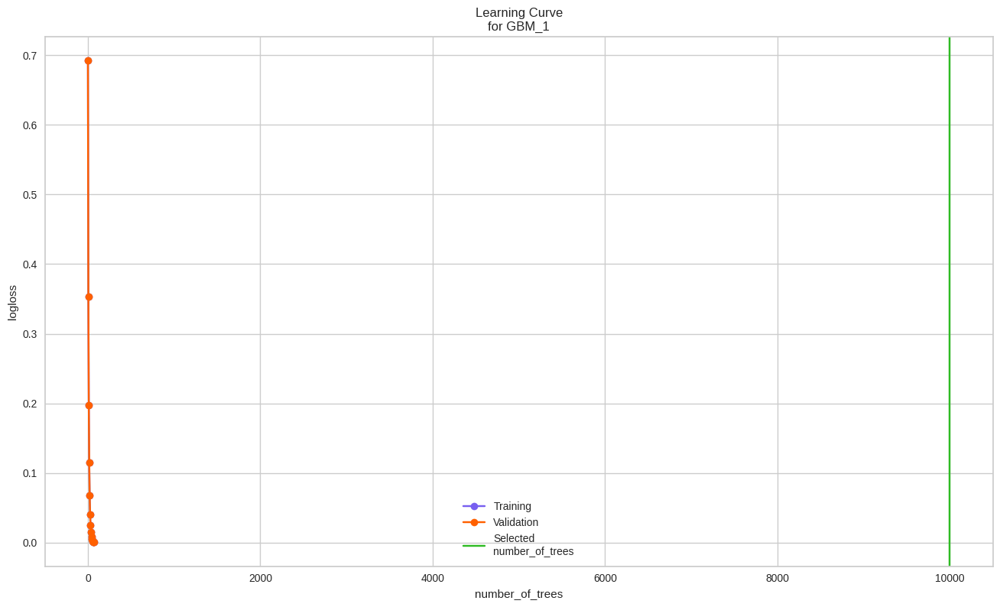

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

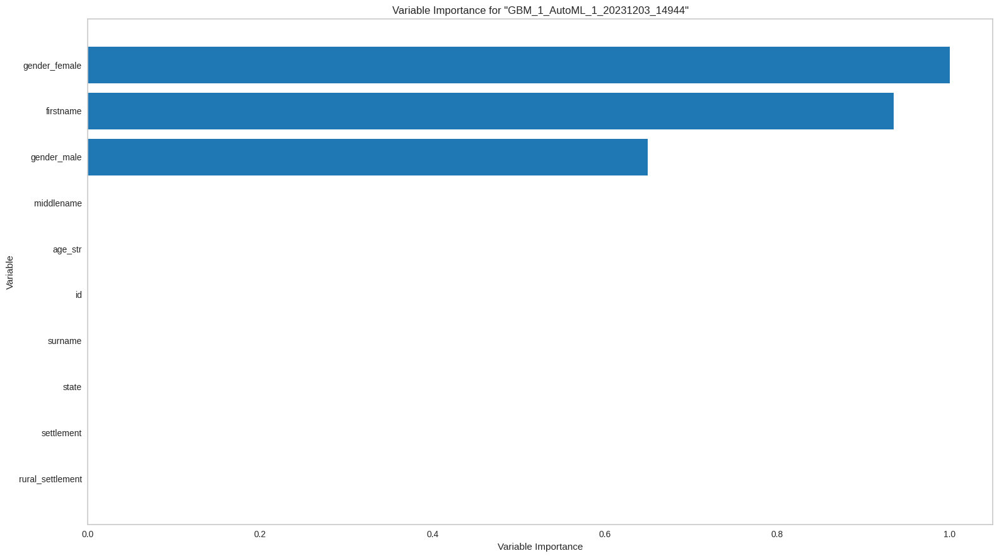

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

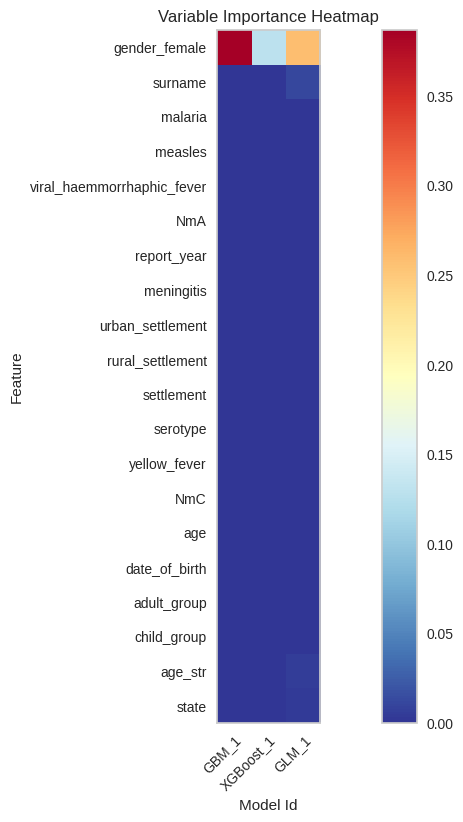

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

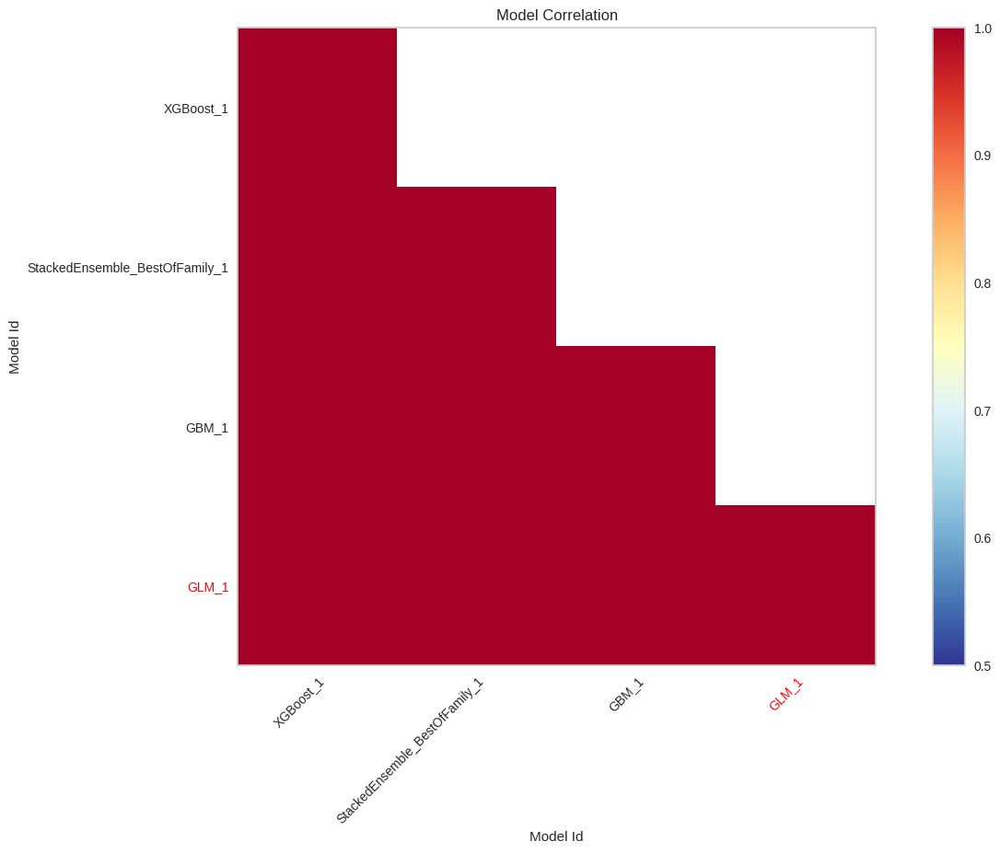

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

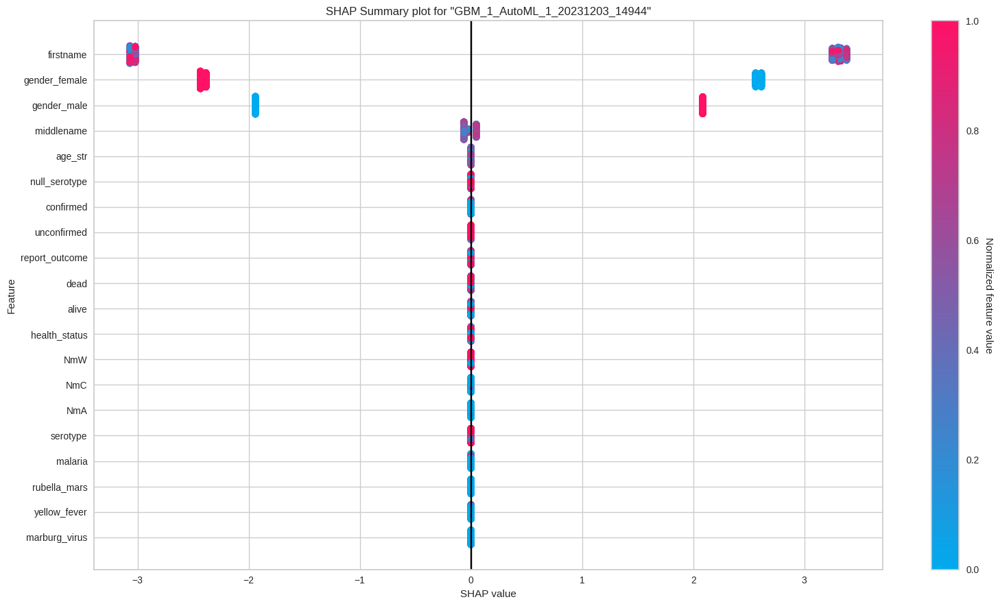

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

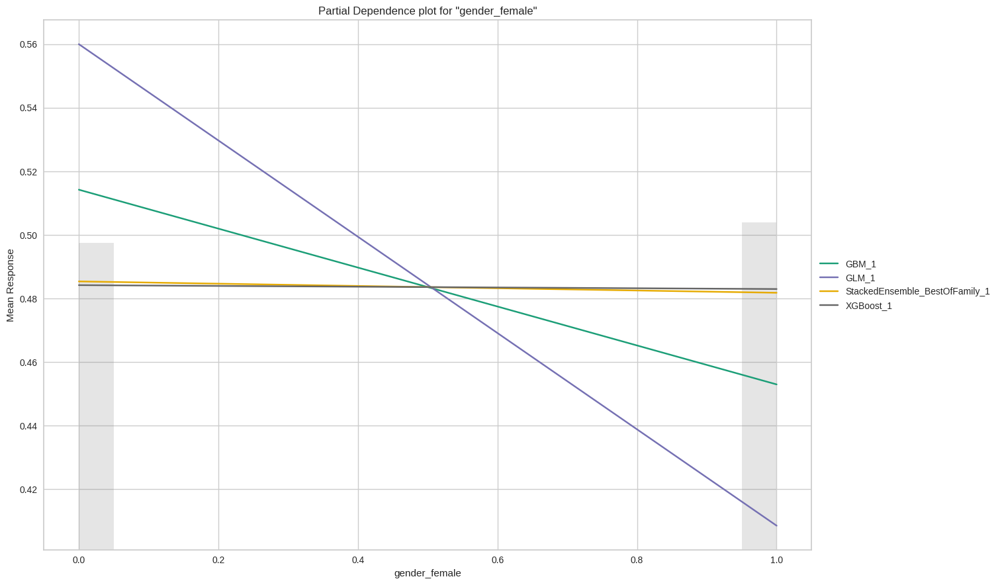

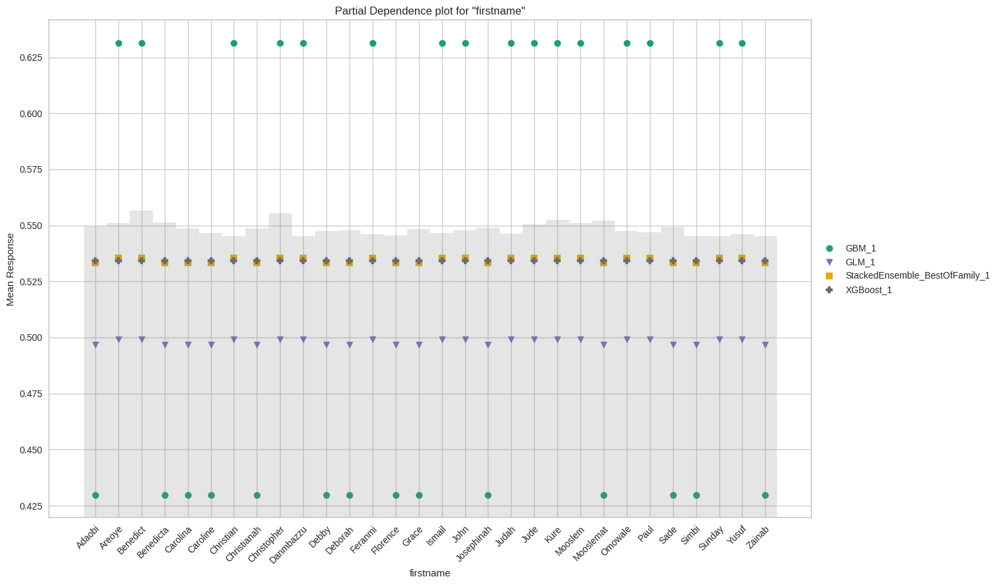

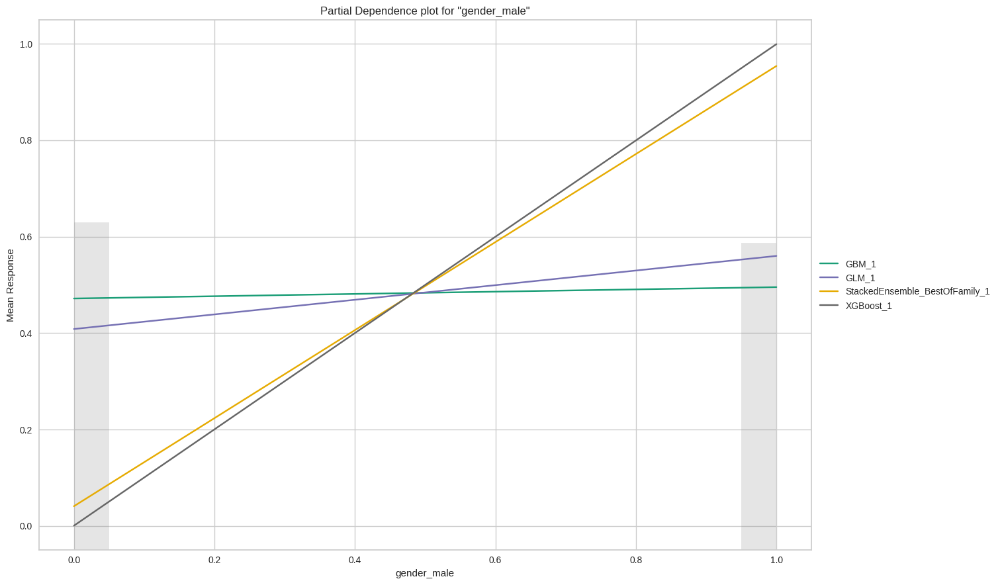

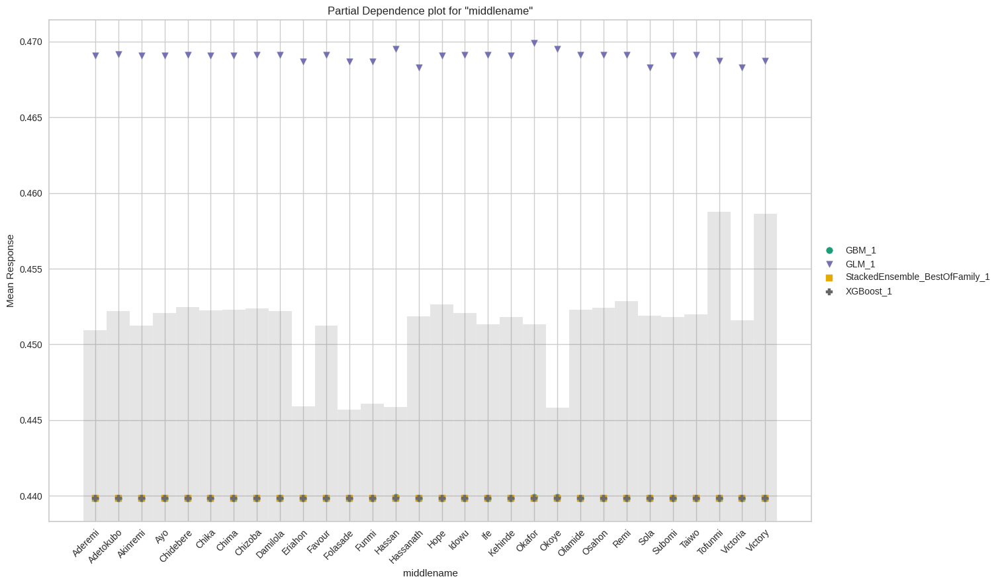

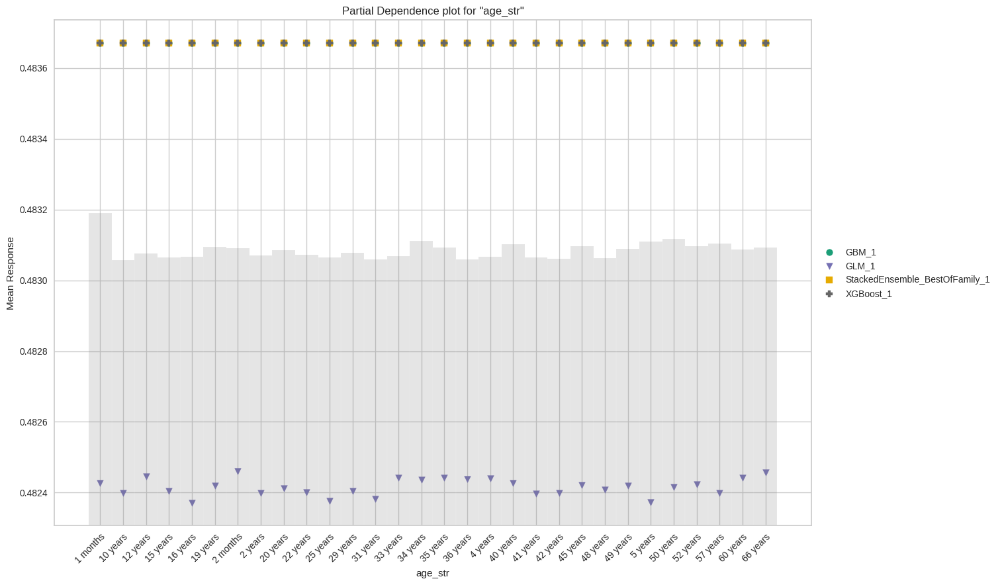

In [58]:
exa = aml.explain(df_test)

#Observations:
1. Variable Importance plot - As we have seen in earlier two models, In autoML model also we have Diarrhoea as the most important feature
2. Variable Importance plot - The next important features are Malaria, Ebola, Measles, Confirmed and Yellow_Fever and so on
3. SHAP Summary - In Shap summary also we can see that the features such as Diarrohea, Age and Malaria to be some of the most important features for predicting the cholera disease

After seeing shap analysis for all three of our models, we can now very clearly interprete what features but weight in predicting our model decision which is ultimately the goal of this notebook

# LIME Analysis

LIME (Local Interpretable Model-agnostic Explanations) is a technique for model-agnostic interpretability, particularly useful when you want to understand the predictions of complex machine learning models on specific instances or subsets of your data.

When to Use Each:
LIME:

Use LIME when you need interpretable explanations for specific instances or small subsets of data.
Suitable for cases where a local, easily understandable model is sufficient.
SHAP:

Use SHAP when you want both local and global explanations and a unified framework for interpreting black-box models.
Useful for gaining insights into feature importance and understanding the overall behavior of your model.

In [64]:
from sklearn import tree
import graphviz

regressor = tree.DecisionTreeRegressor(random_state=1, max_depth=6)
regressor = regressor.fit(train_X, train_y)
explainer_decision_model = lime_tabular.LimeTabularExplainer(training_data=np.array(train_X), feature_names=train_X.columns, class_names=['age'], mode='regression')

exp = explainer_decision_model.explain_instance(val_X.values[0], regressor.predict)
exp.show_in_notebook(show_table=True)

exp = explainer_decision_model.explain_instance(val_X.values[10], regressor.predict)
exp.show_in_notebook(show_table=True)

exp = explainer_decision_model.explain_instance(val_X.values[5], regressor.predict)
exp.show_in_notebook(show_table=True)

exp = explainer_decision_model.explain_instance(val_X.values[2], regressor.predict)
exp.show_in_notebook(show_table=True)

#Conclusion:

SHAP and LIME are both widely used techniques for interpreting machine learning model predictions, but they have distinct characteristics.

SHAP is a global interpretation method that assesses the importance of each feature across the entire dataset. It employs game theory and is insensitive to the choice of the background distribution. SHAP values exhibit properties such as local accuracy, consistency, and handling missing data.

In contrast, LIME is a local interpretation method that simplifies a model's behavior around a specific instance. It constructs a new model by perturbing the input features of an instance and observing the resulting changes in the output. LIME is user-friendly and applicable to various models.

In the context of a specific dataset, the top-performing model identified by AutoML is gbm. However, when implementing a classifier like Decision Tree, a superior accuracy of 88.09% on testing data was achieved. Conversely, Linear Regression demonstrated an accuracy of 79.8% on training data. Subsequently, SHAP values were computed for each model using the SHAP analysis method, and various plots, including permutation plots, waterfall plots, and feature importance bar charts, were generated.

For each model, the crucial features varied. The Decision Tree model exhibited the highest accuracy and identified Diarrhea as the most significant feature influencing the target variable 'Cholera'. This implies a strong dependency on features such as Diarrhea, Measles, Ebola, and Yellow Fever for predicting Cholera in this model.


#License:

Copyright (c) 2023 Manogna Pallapothu

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.